In [77]:
import csv
import json
import pandas as pd
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer 
import string
import pickle
import collections
from wordcloud import WordCloud
import matplotlib.pyplot as plt

[nltk_data] Downloading package punkt to /Users/boomssv/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/boomssv/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [30]:
conda install -c conda-forge wordcloud

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.12.0
  latest version: 22.9.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /Users/boomssv/opt/anaconda3

  added / updated specs:
    - wordcloud


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    conda-22.9.0               |   py37hf985489_1         973 KB  conda-forge
    python_abi-3.7             |          2_cp37m           4 KB  conda-forge
    wordcloud-1.8.2.2          |   py37h8052db5_1         172 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         1.1 MB

The following NEW packages will be INSTALLED:

  python_abi         conda-forge/osx-64::python_abi-3.7-2_cp37m
  wordcloud          conda-forge/osx-64::wordcloud-1.

In [151]:
bars_review = pd.read_csv("./data/bars_list_ca.csv").drop(columns=['Unnamed: 0'])

In [152]:
bars_review

,business_id,stars_x,text,name,address,city,state,postal_code,latitude,longitude,stars_y,review_count,is_open,attributes,hours
0,SZU9c8V2GuREDN5KgyHFJw,5.0,We were a bit weary about trying the Shellfish...,Santa Barbara Shellfish Company,230 Stearns Wharf,Santa Barbara,CA,93101,34.408715,-119.685019,4.0,2404,1,"{'OutdoorSeating': 'True', 'RestaurantsAttire'...","{'Monday': '0:0-0:0', 'Tuesday': '11:0-21:0', ..."
1,eL4lyE7LNoXEMvpcJ8WNVw,5.0,"Great, beautiful spot to do wine tasting. I lo...",Deep Sea Tasting Room,217 G Stearns Wharf,Santa Barbara,CA,93101,34.410007,-119.685549,4.0,472,1,"{'RestaurantsGoodForGroups': 'True', 'OutdoorS...","{'Monday': '11:0-20:0', 'Tuesday': '11:0-20:0'..."
2,eL4lyE7LNoXEMvpcJ8WNVw,3.0,This was a tough one! On the merits of the w...,Deep Sea Tasting Room,217 G Stearns Wharf,Santa Barbara,CA,93101,34.410007,-119.685549,4.0,472,1,"{'RestaurantsGoodForGroups': 'True', 'OutdoorS...","{'Monday': '11:0-20:0', 'Tuesday': '11:0-20:0'..."
3,SZU9c8V2GuREDN5KgyHFJw,5.0,"I love trying fresh seafood on piers, wharfs a...",Santa Barbara Shellfish Company,230 Stearns Wharf,Santa Barbara,CA,93101,34.408715,-119.685019,4.0,2404,1,"{'OutdoorSeating': 'True', 'RestaurantsAttire'...","{'Monday': '0:0-0:0', 'Tuesday': '11:0-21:0', ..."
4,SZU9c8V2GuREDN5KgyHFJw,5.0,"Super delish!! No frills! Just great sea food,...",Santa Barbara Shellfish Company,230 Stearns Wharf,Santa Barbara,CA,93101,34.408715,-119.685019,4.0,2404,1,"{'OutdoorSeating': 'True', 'RestaurantsAttire'...","{'Monday': '0:0-0:0', 'Tuesday': '11:0-21:0', ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44688,q-1ICFSqs2MwDGfe5tX-SQ,5.0,Now my favorite brunch spot in Santa Barbara. ...,Yellow Belly,2611 De La Vina St,Santa Barbara,CA,93105,34.434854,-119.724729,4.0,337,1,"{'Music': ""{'dj': False}"", 'NoiseLevel': ""'ave...","{'Monday': '0:0-0:0', 'Tuesday': '16:30-20:0',..."
44689,wMZAnrfwV-qHiV5zdTSrzw,5.0,The combo meat plate was so good and tons of f...,The Creekside Restaurant & Bar,4444 Hollister Ave,Santa Barbara,CA,93110,34.440058,-119.771789,4.0,296,1,"{'RestaurantsTakeOut': 'True', 'WheelchairAcce...","{'Monday': '0:0-0:0', 'Tuesday': '16:0-19:30',..."
44690,KSYONgGtrK0nKXfroB-bwg,2.0,My table got so many weird looks from the empl...,Loquita,202 State St,Santa Barbara,CA,93101,34.414204,-119.691644,4.5,914,1,"{'WiFi': ""u'no'"", 'BusinessAcceptsCreditCards'...","{'Monday': '0:0-0:0', 'Tuesday': '17:0-21:0', ..."
44691,fiQxkb1pfPpvrr0oYYYBcA,5.0,"If I could give more than 5 stars, I would! I ...",The Daisy Restaurant,1221 State St,Santa Barbara,CA,93101,34.423787,-119.705281,5.0,98,1,"{'DogsAllowed': 'True', 'HappyHour': 'True', '...","{'Monday': '0:0-0:0', 'Wednesday': '17:0-21:0'..."


In [107]:
# Define a function for NLP

def txt_process(text):
    # 1. Deal with not ... case
    ## 1.1 some word include contractions (n't, 'll, 're)
    new_text = re.sub(r'won\'t', 'will not', text)
    new_text = re.sub(r'n\'t', ' not', new_text)
    new_text = re.sub(r'\'ll', ' will', new_text)
    new_text = re.sub(r'\'m', ' am', new_text)
    ## 1.2 take not ... case into account
    new_text = re.sub(r'not ', 'not_', new_text)
    
    # 2. Tokenize the sentence into words (also remove puncutation except "_" and lowercase)
    word_split = nltk.word_tokenize(new_text.lower().translate(str.maketrans('', '', string.punctuation.replace("_",""))))
    
    # 3. Remove stopwords
    stops = set(stopwords.words('english'))
    review_word = [word for word in word_split if word not in stops]
    
    # 4. Stemming words
    sb_stemmer = SnowballStemmer("english",)
    review_stem_word = []
    for word in review_word:
        stemmer = sb_stemmer.stem(word)
        review_stem_word.append(stemmer)
    return review_stem_word

In [108]:
txt_process(bars_review["text"][7])

['review',
 'food',
 'hard',
 'justifi',
 '16',
 'burger',
 'fri',
 'wowow',
 'burger',
 'delici',
 'not_sur',
 'starv',
 'order',
 'lama',
 'burger',
 'patti',
 'size',
 'qualiti',
 'also',
 'random',
 'ingredi',
 'thrown',
 'probabl',
 'not_seen',
 'like',
 'gruyer',
 'stuf',
 'pepper',
 'burger',
 'fri',
 'came',
 'nice',
 'crisp',
 'vs',
 'soggi',
 'bun',
 'burger',
 'great',
 'order',
 'insid',
 'nook',
 'sit',
 'around',
 'ton',
 'craft',
 'beer',
 'choos',
 'could',
 'see',
 'place',
 'get',
 'pack',
 'weekend']

In [128]:
# Create the data for review for each star

rating = list(bars_review["stars_x"])
word_1_star = []
word_2_star = []
word_3_star = []
word_4_star = []
word_5_star = []
review_word_list = []

for i in range(len(bars_review)):
    #rating.append(bars_review["stars_x"][i])
    review_word_i = txt_process(bars_review["text"][i])
    review_word_list.append(review_word_i)
    
    # check how many stars do they receive
    if bars_review["stars_x"][i] == 1.0:
        word_1_star.append(review_word_i)
        
    if bars_review["stars_x"][i] == 2.0:
        word_2_star.append(review_word_i)
     
    if bars_review["stars_x"][i] == 3.0:
        word_3_star.append(review_word_i) 
        
    if bars_review["stars_x"][i] == 4.0:
        word_4_star.append(review_word_i)
        
    if bars_review["stars_x"][i] == 5.0:
        word_5_star.append(review_word_i)

# Delete some too broad words
useless_words = ("food", "place", "restaur", "time", "realli", "would", "us", "also", "definit")
review_word_list = [word for word in review_word_list if word not in useless_words]
word_1_star = [word for i in word_1_star for word in i if word not in useless_words]
word_2_star = [word for i in word_2_star for word in i if word not in useless_words]
word_3_star = [word for i in word_3_star for word in i if word not in useless_words]
word_4_star = [word for i in word_4_star for word in i if word not in useless_words]
word_5_star = [word for i in word_5_star for word in i if word not in useless_words]

In [132]:
word_1_star

['receiv',
 'togo',
 'order',
 'ask',
 'coupl',
 'cup',
 'water',
 'tomato',
 'sauc',
 'cashier',
 'said',
 'need',
 'first',
 'take',
 'care',
 'custom',
 'wait',
 'order',
 'call',
 'number',
 'later',
 'even',
 'finish',
 '40',
 'minut',
 'later',
 'never',
 'heard',
 'call',
 'think',
 'deserv',
 'better',
 'order',
 '35',
 'worth',
 'usual',
 'stay',
 'away',
 'pier',
 'sinc',
 'tourist',
 'trap',
 'went',
 'one',
 'sinc',
 'mani',
 'good',
 'review',
 'calm',
 'chowder',
 'good',
 'piec',
 'clam',
 'soup',
 'pretti',
 'thick',
 'ok',
 'not_a',
 'good',
 'review',
 'claim',
 'crab',
 'cake',
 'ok',
 'shrimp',
 'scallop',
 'pasta',
 'aw',
 'small',
 'shrimp',
 'scallop',
 'not_fresh',
 'sour',
 'either',
 'wrong',
 'ingredi',
 'overdu',
 'sauc',
 'first',
 'bathroom',
 'smell',
 'like',
 'dirti',
 'seafood',
 'almost',
 'took',
 'away',
 'appetit',
 'start',
 'order',
 'king',
 'crab',
 'lobster',
 'taco',
 'hard',
 'meat',
 'king',
 'crab',
 'consid',
 'expens',
 '3',
 'pound',
 '

In [155]:
review_with_rating = pd.DataFrame(rating, columns=["rating"])
review_with_rating["review_words"] = review_word_list

In [156]:
review_with_rating

,rating,review_words
0,5.0,"[bit, weari, tri, shellfish, compani, wharf, o..."
1,5.0,"[great, beauti, spot, wine, tast, love, wine, ..."
2,3.0,"[tough, one, merit, wine, fair, averag, unders..."
3,5.0,"[love, tri, fresh, seafood, pier, wharf, seasi..."
4,5.0,"[super, delish, frill, great, sea, food, sour,..."
...,...,...
44688,5.0,"[favorit, brunch, spot, santa, barbara, two, g..."
44689,5.0,"[combo, meat, plate, good, ton, food, even, ca..."
44690,2.0,"[tabl, got, mani, weird, look, employe, could,..."
44691,5.0,"[could, give, 5, star, would, reserv, daisi, 2..."


In [157]:
count_review = {}
for word in review_stem_word:
    count_review[word] = count_review.get(word, 0) + 1

In [225]:
count_review

{'bit': 3940,
 'weari': 18,
 'tri': 10538,
 'shellfish': 437,
 'compani': 510,
 'wharf': 550,
 'often': 813,
 'mani': 2961,
 'place': 23992,
 'like': 13460,
 'see': 2950,
 'canneri': 3,
 'row': 112,
 'monterey': 35,
 'feast': 67,
 'captiv': 13,
 'audienc': 15,
 'provid': 829,
 'substandard': 14,
 'fare': 181,
 'high': 4644,
 'price': 5389,
 'howev': 2080,
 'embolden': 1,
 'perenni': 5,
 'good': 24470,
 'review': 3523,
 'yelp': 1615,
 'suppress': 3,
 'initi': 239,
 'observ': 67,
 'went': 4973,
 'ahead': 383,
 'small': 3725,
 'definit': 7420,
 'plan': 946,
 'wait': 8968,
 'either': 1048,
 'know': 3802,
 'perhap': 419,
 'visit': 4588,
 'outsid': 4183,
 'peak': 97,
 'hour': 4585,
 'luckili': 252,
 '20': 1231,
 'minut': 3772,
 'dinner': 6549,
 'rush': 556,
 'level': 559,
 'special': 3632,
 'local': 3539,
 'rock': 1060,
 'crab': 4254,
 '25': 460,
 '3': 2627,
 'lbs': 44,
 'california': 704,
 'salad': 6173,
 'choic': 1670,
 'soupchowd': 1,
 'take': 4090,
 'look': 6220,
 'tray': 102,
 'serv': 4

In [204]:
len(list(count_review.keys())) # total number of words

39647

In [137]:
count_review_1star = {}
for word in word_1_star:
    count_review_1star[word] = count_review_1star.get(word, 0) + 1

count_review_2star = {}
for word in word_2_star:
    count_review_2star[word] = count_review_2star.get(word, 0) + 1

count_review_3star = {}
for word in word_3_star:
    count_review_3star[word] = count_review_3star.get(word, 0) + 1

count_review_4star = {}
for word in word_4_star:
    count_review_4star[word] = count_review_4star.get(word, 0) + 1

count_review_5star = {}
for word in word_5_star:
    count_review_5star[word] = count_review_5star.get(word, 0) + 1

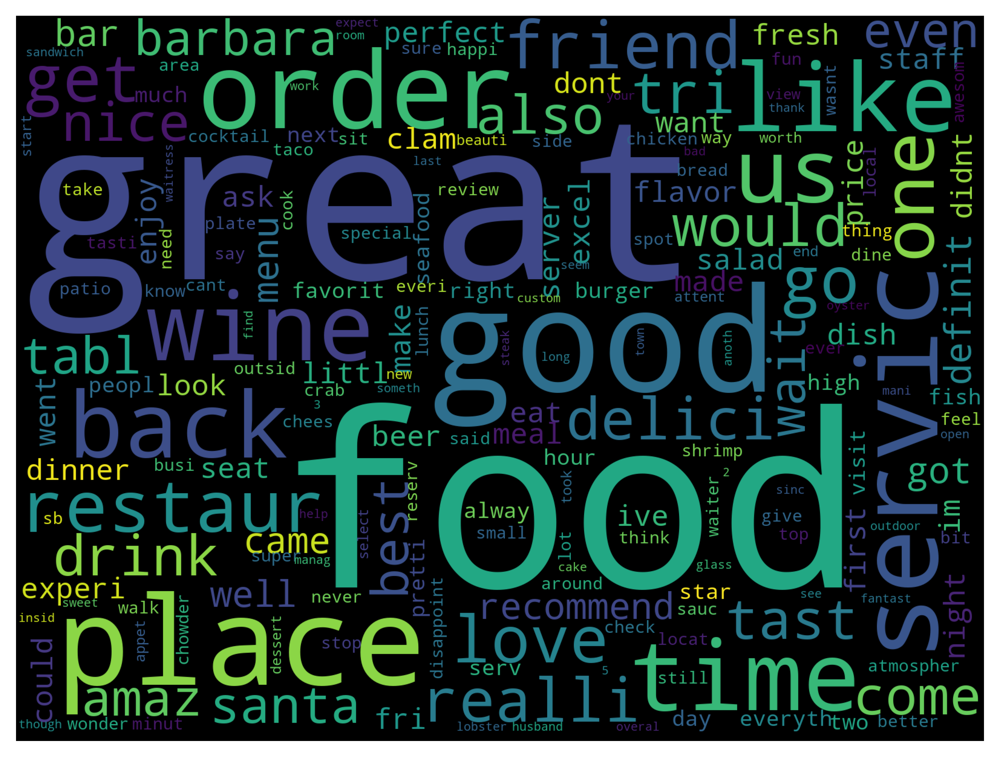

In [138]:
# Word cloud of all review words

word_cloud = WordCloud(background_color = 'Black',width=400,height=300,scale=4,max_font_size=100)
word_cloud.generate_from_frequencies(count_review)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.savefig('wordcloud_allwords.jpg')
plt.show()

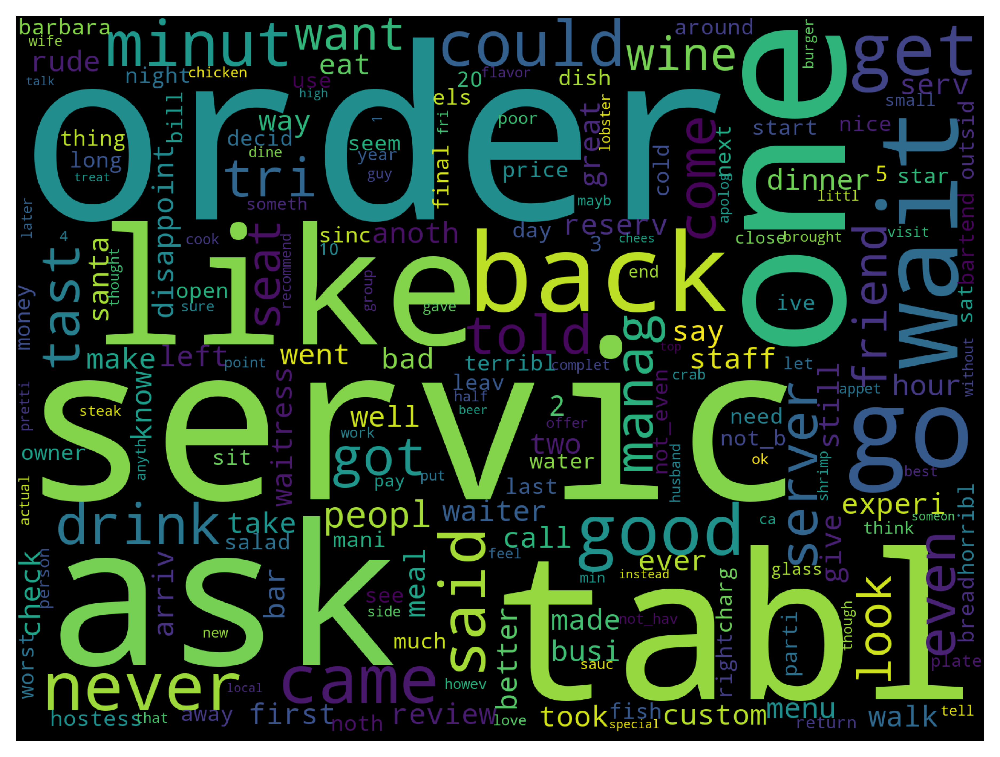

In [139]:
# Word cloud of 1-star rating

word_cloud = WordCloud(background_color = 'Black',width=400,height=300,scale=4,max_font_size=100)
word_cloud.generate_from_frequencies(count_review_1star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.show()

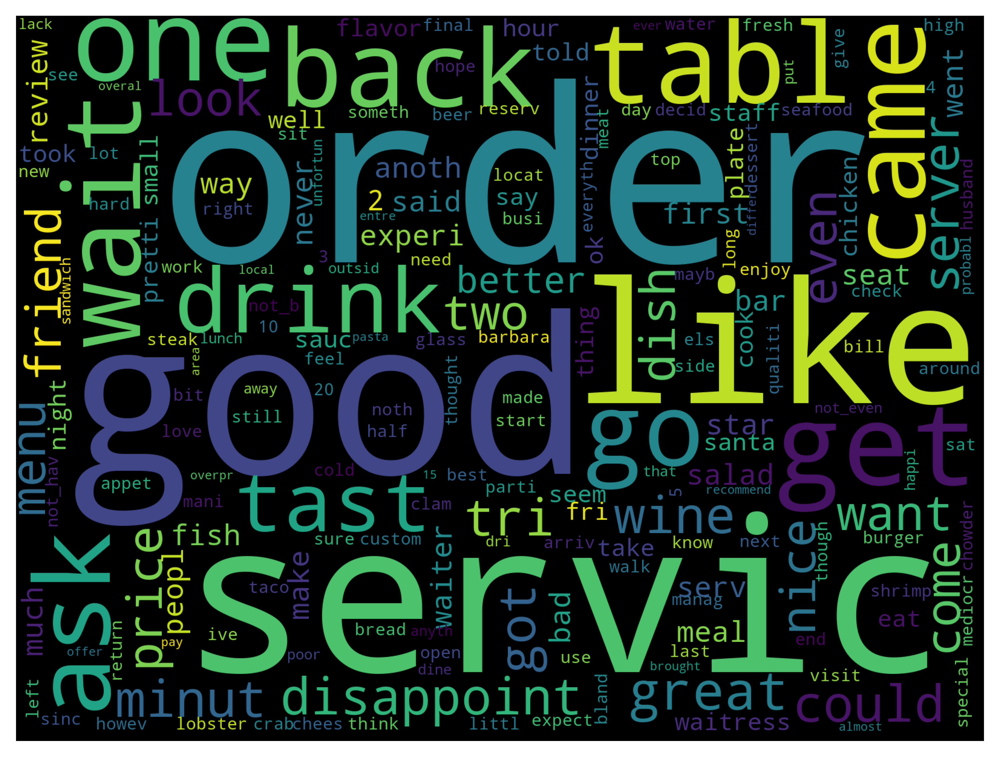

In [140]:
# Word cloud of 2-star rating

word_cloud = WordCloud(background_color = 'Black',width=400,height=300,scale=4,max_font_size=100)
word_cloud.generate_from_frequencies(count_review_2star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.show()

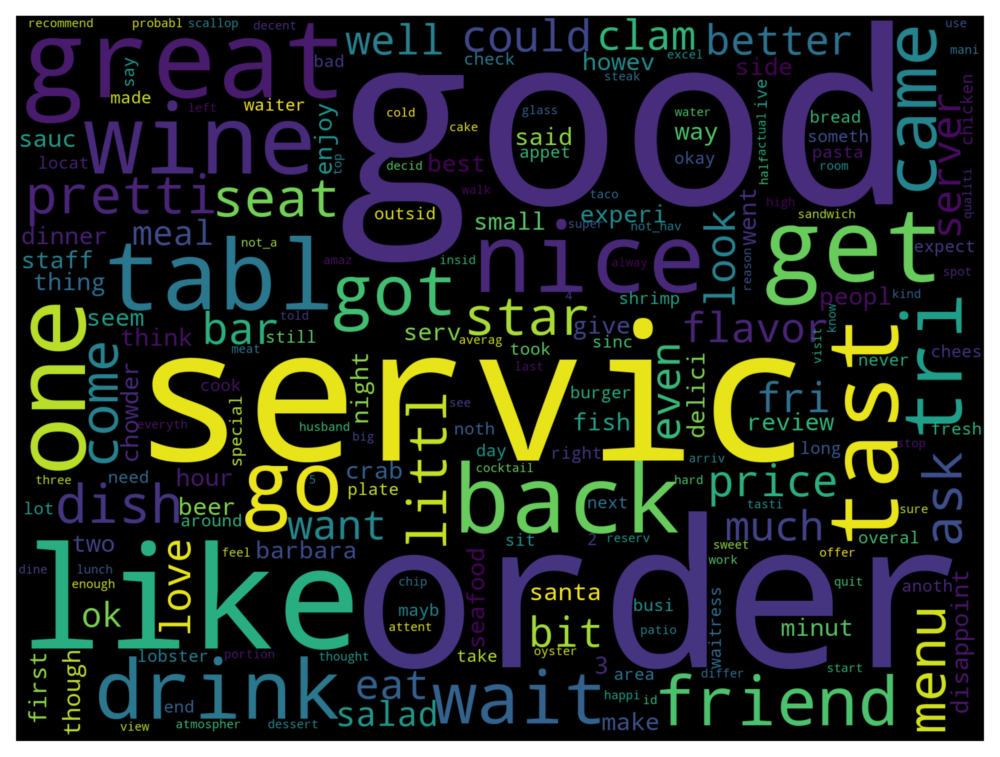

In [141]:
# Word cloud of 3-star rating

word_cloud = WordCloud(background_color = 'Black',width=400,height=300,scale=4,max_font_size=100)
word_cloud.generate_from_frequencies(count_review_3star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.show()

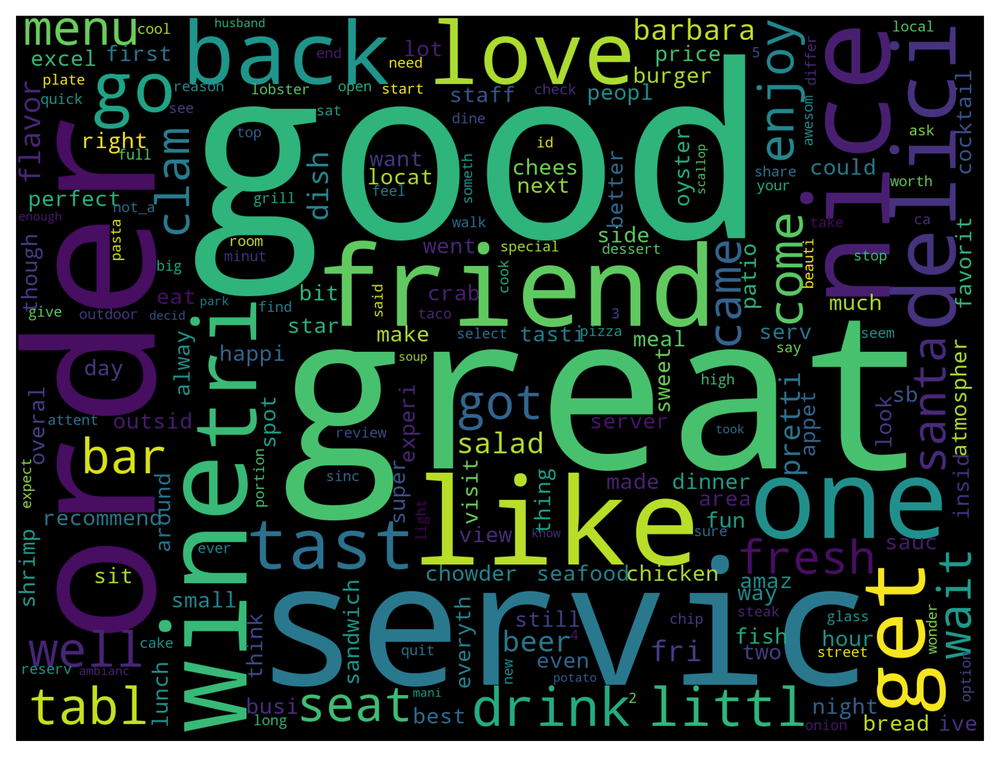

In [142]:
# Word cloud of 4-star rating

word_cloud = WordCloud(background_color = 'Black',width=400,height=300,scale=4,max_font_size=100)
word_cloud.generate_from_frequencies(count_review_4star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.show()

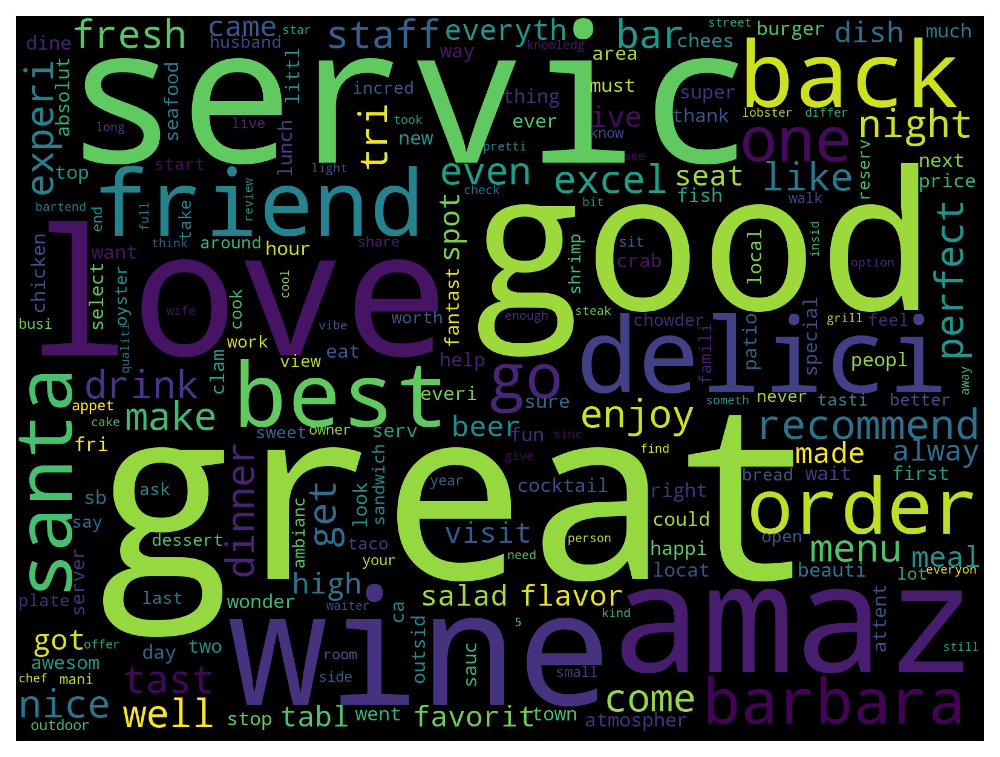

In [143]:
# Word cloud of 5-star rating

word_cloud = WordCloud(background_color = 'Black',width=400,height=300,scale=4,max_font_size=100)
word_cloud.generate_from_frequencies(count_review_5star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.show()

In [148]:
# Histogram

review_with_rating

,0,review_words
0,5.0,"[bit, weari, tri, shellfish, compani, wharf, o..."
1,5.0,"[great, beauti, spot, wine, tast, love, wine, ..."
2,3.0,"[tough, one, merit, wine, fair, averag, unders..."
3,5.0,"[love, tri, fresh, seafood, pier, wharf, seasi..."
4,5.0,"[super, delish, frill, great, sea, food, sour,..."
...,...,...
44688,5.0,"[favorit, brunch, spot, santa, barbara, two, g..."
44689,5.0,"[combo, meat, plate, good, ton, food, even, ca..."
44690,2.0,"[tabl, got, mani, weird, look, employe, couldn..."
44691,5.0,"[could, give, 5, star, would, reserv, daisi, 2..."


In [312]:
# Define function for counting specific word

def count_word_rating(wordcheck):
    count_word_rating = {}
    for i in range(len(review_with_rating)):
        cnt = 0
        for word in review_with_rating["review_words"][i]:
            if word == wordcheck:
                cnt += 1
        count_word_rating[review_with_rating["rating"][i]] = count_word_rating.get(review_with_rating["rating"][i],0) + cnt
        
    return dict(sorted(count_word_rating.items()))

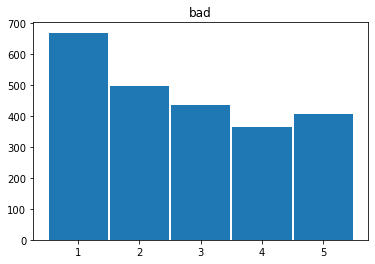

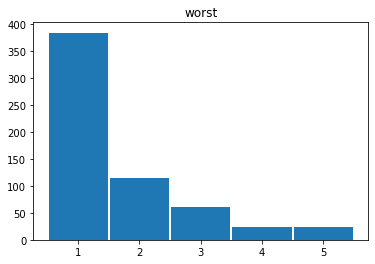

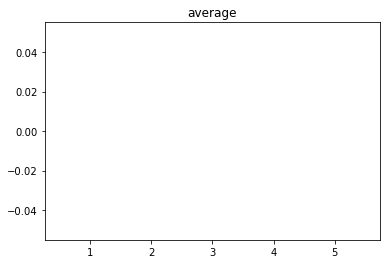

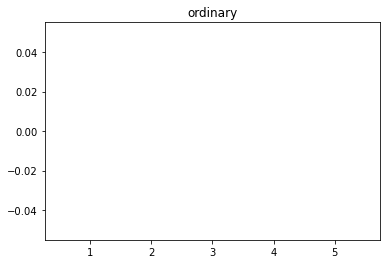

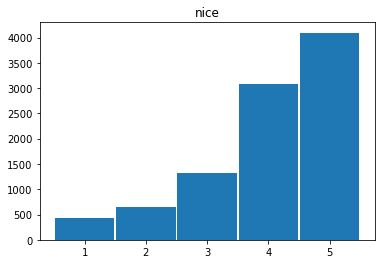

...

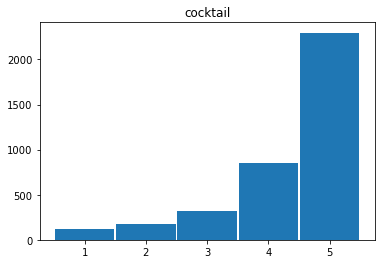

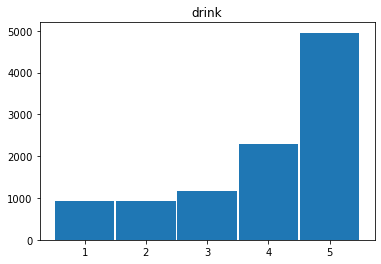

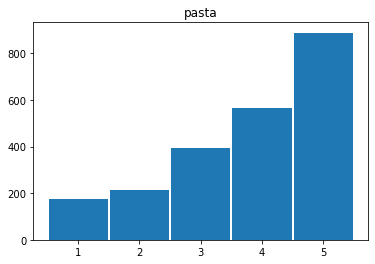

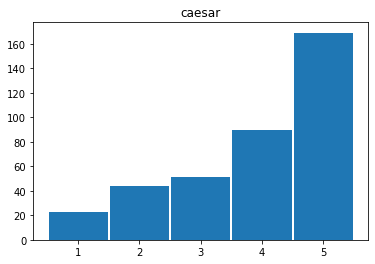

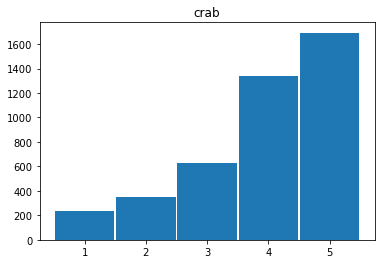

In [343]:
checklist = ["bad","worst","average","ordinary","nice","good","great","recommend"]
ambiance = ["servic","ambienc", "cheap", "expens", "afford", "busy", "clean", "music", "waiter","server"]
menu = ["wine","beer","cocktail","drink","pasta","caesar","crab"]
for i in checklist:
    res = count_word_rating(i)
    plt.bar(list(res.keys()), list(res.values()), width = 0.97)
    plt.title(i)
    plt.show()

for i in ambiance:
    res2 = count_word_rating(i)
    plt.bar(list(res2.keys()), list(res2.values()), width = 0.97)
    plt.title(i)
    plt.show()
    
for i in menu:
    res3 = count_word_rating(i)
    plt.bar(list(res3.keys()), list(res3.values()), width = 0.97)
    plt.title(i)
    plt.show()